### Import Library ###

In [116]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import glob
from keras.preprocessing import image
from sklearn.cluster import KMeans
from skimage.feature import hog
from skimage import exposure
from skimage.measure import label

## 9.1 Prepare HoG feature ##

### 9.1.1 View HoG feature of image ###

In [117]:
dataset_path = './assets/Animals/Cats/'

In [118]:
image_path = glob.glob(f'{dataset_path}*')
image_path

['./assets/Animals/Cats/cat8.webp',
 './assets/Animals/Cats/cat1.jpg',
 './assets/Animals/Cats/cat3.webp',
 './assets/Animals/Cats/cat7.jpg',
 './assets/Animals/Cats/cat6.jpg',
 './assets/Animals/Cats/cat10.jpg',
 './assets/Animals/Cats/cat4.jpg',
 './assets/Animals/Cats/cat5.jpg',
 './assets/Animals/Cats/cat9.jpg',
 './assets/Animals/Cats/cat2.jpeg']

In [119]:
image_storage = []

for path in image_path:
  image = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
  image_storage.append(image)




In [217]:
img = image_storage[8]
img = cv2.resize(img, dsize=(600,600), interpolation=cv2.INTER_AREA)

In [218]:
# Create Image Feature
# Bluring image to reduce noise
blur = cv2.GaussianBlur(img, (5, 5), 0)  # Gaussian Filtering
# Calculate HoG of image
fd, hog_image = hog(blur, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True, multichannel=True)


/var/folders/rq/qhkf31pj62z2ycvxk31vk52w0000gn/T/ipykernel_14494/972355250.py:5: FutureWarning: `multichannel` is a deprecated argument name for `hog`. It will be removed in version 1.0. Please use `channel_axis` instead.
  fd, hog_image = hog(blur, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True, multichannel=True)


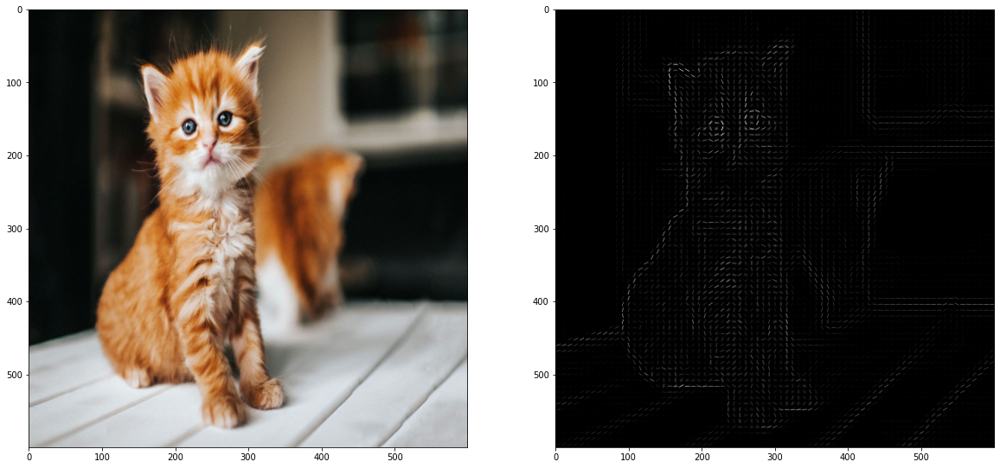

In [219]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(img)
plt.subplot(1,2,2)
plt.imshow(hog_image, cmap="gray")

### 9.1.2 Prepare HoG feature of subimages ###

In [220]:
# Define block size for subimage
(h, w) = img.shape[:2]
Block_size = (80, 80)
# Define stride
stride = (20, 20)

In [221]:
(h , w)

(600, 600)

In [222]:
# Define Sliding window position of row, column (Top left position)
posRow = np.arange(0, h - Block_size[0] + 1, stride[0])
posCol = np.arange(0, w - Block_size[1] + 1, stride[1])

In [223]:
posRow

array([  0,  20,  40,  60,  80, 100, 120, 140, 160, 180, 200, 220, 240,
       260, 280, 300, 320, 340, 360, 380, 400, 420, 440, 460, 480, 500,
       520])

In [224]:
# Create subimage feature
# Calculate HoG of each subimage in Sliding window
hogfeatures = []
for i in range(len(posRow)):
  for j in range(len(posCol)):
    startH = posRow[i]
    endH = posRow[i] + Block_size[0]
    startW = posCol[j]
    endW = posCol[j] + Block_size[1]
    subimg = img[ startH:endH, startW:endW, :]

    blur = cv2.GaussianBlur(subimg,(5,5), 0) # Gaussian Filtering
    fd, hog_image = hog(blur, orientations=9, pixels_per_cell=(4,4),cells_per_block=(2,2), visualize=True, multichannel=True)
    hogfeatures.append(fd)


/var/folders/rq/qhkf31pj62z2ycvxk31vk52w0000gn/T/ipykernel_14494/2108268827.py:13: FutureWarning: `multichannel` is a deprecated argument name for `hog`. It will be removed in version 1.0. Please use `channel_axis` instead.
  fd, hog_image = hog(blur, orientations=9, pixels_per_cell=(4,4),cells_per_block=(2,2), visualize=True, multichannel=True)


In [225]:
hogfeatures

[array([0.38690374, 0.        , 0.38690374, ..., 0.        , 0.        ,
        0.        ]),
 array([0.24806947, 0.        , 0.3508232 , ..., 0.        , 0.        ,
        0.        ]),
 array([0.29397237, 0.        , 0.29179207, ..., 0.07183027, 0.22271078,
        0.22245139]),
 array([0.30714756, 0.        , 0.359507  , ..., 0.09515614, 0.        ,
        0.        ]),
 array([0.22130606, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]),
 array([0.28848697, 0.34081961, 0.        , ..., 0.35533281, 0.12098896,
        0.        ]),
 array([0.23409599, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]),
 array([0.08197823, 0.        , 0.        , ..., 0.        , 0.        ,
        0.42534856]),
 array([0.27336058, 0.        , 0.12886341, ..., 0.03770435, 0.        ,
        0.        ]),
 array([0.22997653, 0.        , 0.06504719, ..., 0.10106975, 0.037921  ,
        0.        ]),
 array([0.04972109, 0.        , 0.07031623, ..., 0

## 9.2 Image Segmentation using K-Mean clustering ##

### 9.2.1 K-Mean clustering ###

In [226]:
# Clean feature in NA
np.nan_to_num(hogfeatures, nan=0)

array([[0.38690374, 0.        , 0.38690374, ..., 0.        , 0.        ,
        0.        ],
       [0.24806947, 0.        , 0.3508232 , ..., 0.        , 0.        ,
        0.        ],
       [0.29397237, 0.        , 0.29179207, ..., 0.07183027, 0.22271078,
        0.22245139],
       ...,
       [0.15348331, 0.        , 0.32558725, ..., 0.        , 0.        ,
        0.        ],
       [0.14584948, 0.        , 0.29675978, ..., 0.        , 0.        ,
        0.        ],
       [0.21616885, 0.        , 0.        , ..., 0.07977253, 0.        ,
        0.        ]])

In [227]:
# K-Mean Clustering
N = 5
kmeans = KMeans(n_clusters=N, random_state=0)
clusters = kmeans.fit_predict(hogfeatures)


### 9.2.2 Region of Interest ( ROI )

In [228]:
# Reshape clusterID result to Grid
cluster_array = clusters.reshape(len(posRow), len(posCol))

[[4 4 4 0 0 0 4 1 0 3 3 0 0 1 1 1 1 1 3 0 0 0 1 1 3 3 3]
 [4 4 4 0 0 0 3 3 3 3 3 3 1 1 1 1 1 1 3 0 0 0 1 3 3 3 3]
 [4 4 4 0 0 3 3 3 3 3 3 3 3 1 1 1 1 1 3 0 0 2 3 3 3 3 0]
 [4 4 4 0 0 3 3 3 3 3 3 3 3 3 1 1 1 1 3 0 0 0 4 3 3 0 0]
 [4 4 4 0 0 3 3 3 3 3 3 3 3 3 3 1 1 1 3 0 0 2 2 2 3 0 0]
 [4 4 4 0 0 3 3 3 3 3 3 3 3 3 1 1 1 1 3 0 0 2 2 2 2 0 2]
 [4 4 4 0 0 3 3 3 3 3 3 3 3 3 1 1 1 1 3 0 2 2 2 2 2 2 2]
 [4 4 4 0 0 3 3 3 3 3 3 3 3 1 1 1 1 2 2 2 2 2 2 2 2 2 2]
 [4 4 4 0 0 3 3 3 3 3 3 3 3 1 1 1 1 2 2 2 2 2 2 2 2 2 2]
 [4 4 4 0 0 3 3 3 3 3 3 3 3 1 1 1 1 1 1 1 1 2 2 2 2 2 2]
 [4 4 4 0 0 0 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 2 2 2 2 4]
 [4 4 4 0 0 0 0 3 0 1 3 3 3 3 3 3 3 3 3 0 0 0 4 4 4 4 4]
 [4 4 4 0 0 0 0 0 0 1 1 3 3 3 3 3 3 3 3 0 0 4 4 4 4 4 4]
 [4 4 4 0 0 0 0 3 0 1 1 3 3 3 3 3 3 3 3 0 0 4 4 4 4 4 4]
 [4 4 4 0 0 3 3 3 0 1 1 3 3 3 3 3 3 3 3 0 0 2 2 2 2 2 2]
 [4 4 4 0 3 3 3 3 1 1 1 1 3 3 3 3 3 3 3 0 0 2 2 2 2 2 2]
 [4 4 4 0 3 3 3 3 1 1 1 3 3 3 3 3 3 3 3 0 0 2 2 2 2 2 2]
 [4 4 4 0 3 3 3 3 1 1 1 3 3 3 3

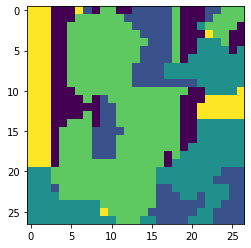

In [229]:
# View cluster_array Result
print(cluster_array)
plt.imshow(cluster_array)

## 9.3 ROI : Region of Interest Drawing ROI bounding box ##

In [230]:
# ReAssign Label in case of multiple ROIs with the same clusterID
all_labels = label(cluster_array)
# Define bounding box parameter
color = (255, 0, 0)
thickness = 1

In [231]:
all_labels

array([[ 1,  1,  1,  0,  0,  0,  2,  3,  0,  4,  4,  0,  0,  5,  5,  5,
         5,  5,  6,  0,  0,  0,  7,  7,  8,  8,  8],
       [ 1,  1,  1,  0,  0,  0,  4,  4,  4,  4,  4,  4,  5,  5,  5,  5,
         5,  5,  6,  0,  0,  0,  7,  8,  8,  8,  8],
       [ 1,  1,  1,  0,  0,  4,  4,  4,  4,  4,  4,  4,  4,  5,  5,  5,
         5,  5,  6,  0,  0,  9,  8,  8,  8,  8,  0],
       [ 1,  1,  1,  0,  0,  4,  4,  4,  4,  4,  4,  4,  4,  4,  5,  5,
         5,  5,  6,  0,  0,  0, 10,  8,  8,  0,  0],
       [ 1,  1,  1,  0,  0,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  5,
         5,  5,  6,  0,  0, 11, 11, 11,  8,  0,  0],
       [ 1,  1,  1,  0,  0,  4,  4,  4,  4,  4,  4,  4,  4,  4,  5,  5,
         5,  5,  6,  0,  0, 11, 11, 11, 11,  0, 11],
       [ 1,  1,  1,  0,  0,  4,  4,  4,  4,  4,  4,  4,  4,  4,  5,  5,
         5,  5,  6,  0, 11, 11, 11, 11, 11, 11, 11],
       [ 1,  1,  1,  0,  0,  4,  4,  4,  4,  4,  4,  4,  4,  5,  5,  5,
         5, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11],


21
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]


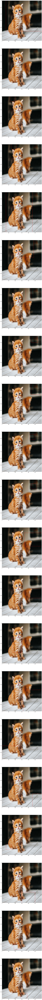

In [236]:
# ROI bounding box
nClass = np.unique(all_labels)

roi_list = []
for i in nClass:
  # calculate from grid to actual position
  objPos = np.argwhere(all_labels==i)
  startBlockH = objPos[:,0].min()
  endBlockH = objPos[:, 0].max()
  startBlockW = objPos[:, 1].min()
  endBlockW = objPos[:, 1].max()
  startF = (posCol[startBlockW], posRow[startBlockH])
  endF = (posCol[endBlockW]+Block_size[1], posRow[endBlockH]+Block_size[0])
  temp = img.copy()
  ROI_bounding_img = cv2.rectangle(temp, startF, endF, color, thickness)

  roi_list.append(ROI_bounding_img)

print(len(roi_list))
plt.figure(figsize=(100, 300))
for i in range(len(roi_list)):

  plt.subplot(len(roi_list), 1, i + 1)
  plt.imshow(roi_list[i])

print(nClass)
